In [1]:
import pyproj
import itertools
import numpy as np
import verde as vd
import harmonica as hm
import matplotlib.pyplot as plt
from sklearn.model_selection import ShuffleSplit

from eql_source_layouts import block_reduced_points

## Read magnetic anomaly data from Rio de Janeiro

In [2]:
# Fetch magnetic anomaly data from Rio de Janeiro
data = hm.datasets.fetch_rio_magnetic()

# Reduce region of the survey to speed things up
region = [-42.60, -42.40, -22.32, -22.20]
inside = vd.inside((data.longitude.values, data.latitude.values), region)
data = data[inside]

# Project coordinates
projection = pyproj.Proj(proj="merc", lat_ts=data.latitude.mean())
data["easting"], data["northing"] = projection(
    data.longitude.values, data.latitude.values
)
coordinates = (data["easting"], data["northing"], data.altitude_m)

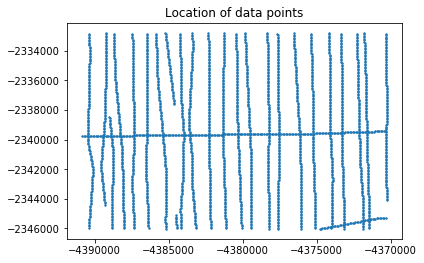

In [3]:
plt.scatter(*coordinates[:2], s=2)
plt.title("Location of data points")
plt.gca().set_aspect("equal")
plt.show()

## Generate a set source points beneath the center of the blocks as an example

In [4]:
points = block_reduced_points(coordinates, spacing=1000, center_coordinates=True)

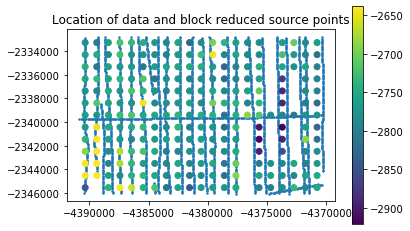

In [5]:
plt.scatter(*coordinates[:2], s=2)
tmp = plt.scatter(*points[:2], c=points[2])
plt.colorbar(tmp)
plt.title("Location of data and block reduced source points")
plt.gca().set_aspect("equal")
plt.show()

## Grid magnetic data

### Model selection

In [6]:
# Build combination of parameters
spacings = [250, 500, 1000, 1500, 2000]
k_nearests = [3, 5, 10]
depth_factors = [0.1, 0.5, 0.75, 1]
static_shifts = [0, -100, -200, -300, -400, -500, -600, -700, -800, -900, -1000]

# Use itertools to create a list with all combinations of parameters to test
parameter_sets = [
    dict(
        spacing=combo[0],
        k_nearest=combo[1],
        depth_factor=combo[2],
        static_shift=combo[3],
    )
    for combo in itertools.product(
        spacings, k_nearests, depth_factors, static_shifts
    )
]
print("Number of combinations:", len(parameter_sets))

Number of combinations: 660


In [7]:
scores = []
gridder = hm.EQLHarmonic()

for params in parameter_sets:
    points = block_reduced_points(coordinates, center_coordinates=True, **params)
    gridder.set_params(points=points)
    shuffle = ShuffleSplit(n_splits=10, test_size=0.3, random_state=1)
    score = np.mean(
        vd.cross_val_score(
            gridder, coordinates, data.total_field_anomaly_nt, cv=shuffle
        )
    )
    scores.append(score)
scores = np.array(scores)

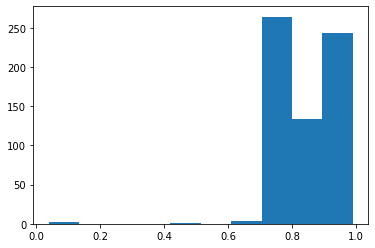

In [8]:
# Plot histogram of scores greater than 0
plt.hist(scores[scores > 0])
plt.show()

In [9]:
best = np.argmax(scores)
print("Best score:", scores[best])
print("Best parameters:", parameter_sets[best])

params = parameter_sets[best]
points = block_reduced_points(coordinates, center_coordinates=True, **params)
gridder.set_params(points=points)
gridder.fit(coordinates, data.total_field_anomaly_nt)

Best score: 0.9894515078893538
Best parameters: {'spacing': 250, 'k_nearest': 10, 'depth_factor': 0.5, 'static_shift': -400}


EQLHarmonic(damping=None, depth_factor=3, k_nearest=1,
            points=(array([-4390464.2891085 , -4388959.15615676, -4387955.73418893, ...,
       -4372151.83819564, -4371900.98270368, -4370395.84975194]),
                    array([-2345916.73926308, -2345916.73926308, -2345916.73926308, ...,
       -2332894.89180706, -2332894.89180706, -2332894.89180706]),
                    array([-813.58889992, -756.70003916, -589.93787487, ..., -528.20793071,
       -588.99677369, -931.16887426])))

### Interpolate data into the regular grid at 200m above the sea level

In [10]:
region = vd.get_region(coordinates)
grid = gridder.grid(
    region=region, spacing=250, data_names=["magnetic_anomaly"], extra_coords=200
)

### Plot best result

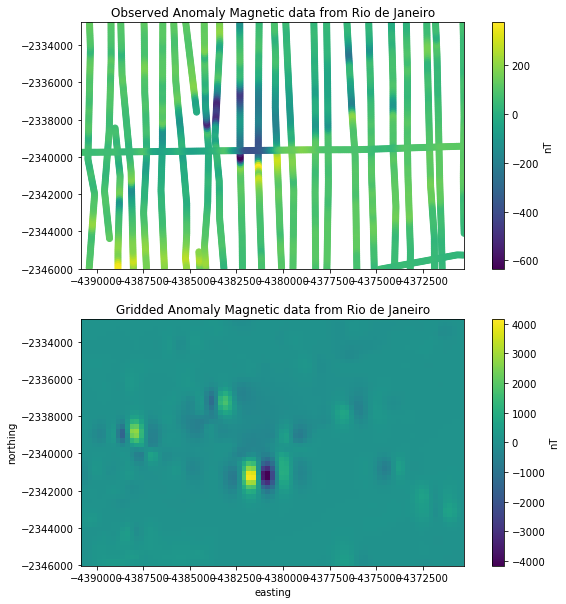

In [11]:
# Plot original magnetic anomaly
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(10, 10))
tmp = ax1.scatter(data.easting, data.northing, c=data.total_field_anomaly_nt)
plt.colorbar(tmp, ax=ax1, label="nT")
ax1.set_xlim(*region[:2])
ax1.set_ylim(*region[2:])
ax1.set_aspect("equal")
ax1.set_title("Observed Anomaly Magnetic data from Rio de Janeiro")

# Plot gridded magnetic anomaly
tmp = grid.magnetic_anomaly.plot.pcolormesh(ax=ax2, add_colorbar=False, cmap="viridis")
plt.colorbar(tmp, ax=ax2, label="nT")
ax2.set_xlim(*region[:2])
ax2.set_ylim(*region[2:])
ax2.set_aspect("equal")
ax2.set_title("Gridded Anomaly Magnetic data from Rio de Janeiro")
plt.show()

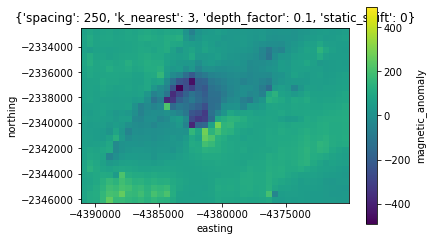

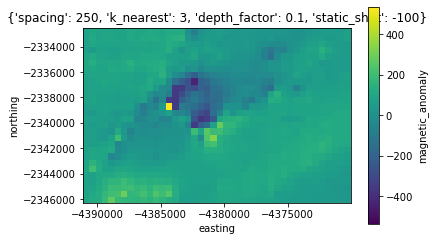

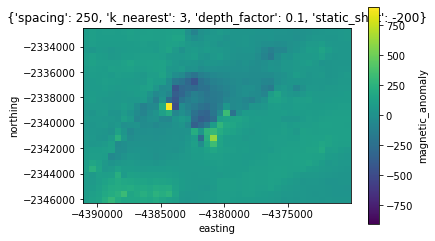

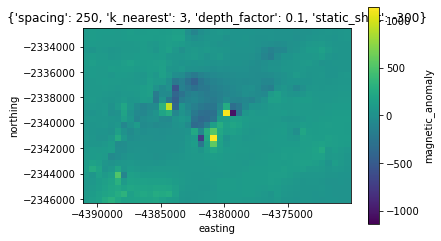

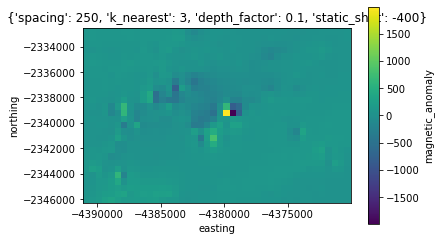

...

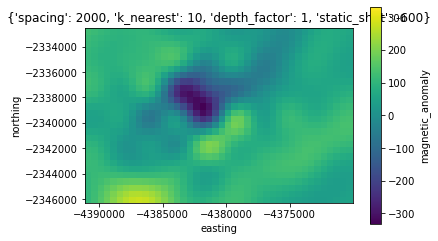

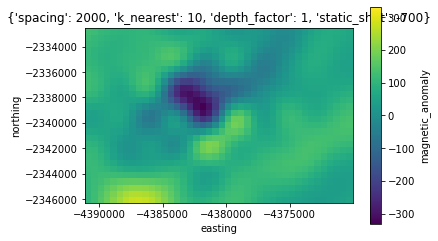

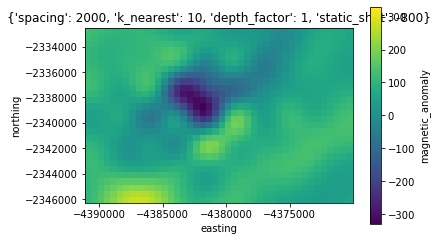

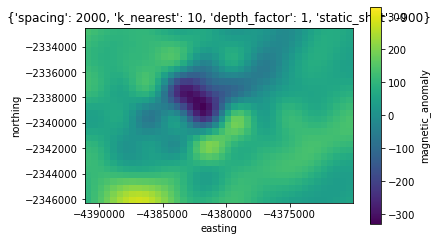

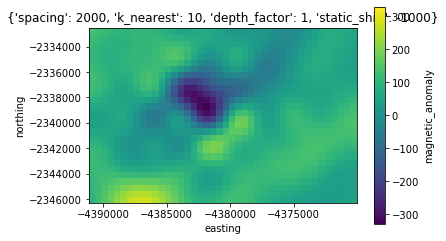

In [12]:
region = vd.get_region(coordinates)

for params in parameter_sets:
    points = block_reduced_points(coordinates, center_coordinates=True, **params)
    gridder.set_params(points=points)
    gridder.fit(coordinates, data.total_field_anomaly_nt)
    grid = gridder.grid(
        region=region, spacing=500, data_names=["magnetic_anomaly"], extra_coords=200
    )

    tmp = grid.magnetic_anomaly.plot.pcolormesh(cmap="viridis")
    plt.gca().set_aspect("equal")
    plt.title(str(params))
    plt.show()